# Analyze Xenium data

The 10x Genomics Xenium In Situ platform is an image-based *in situ* technology that reports counts of a pre-designed gene panel at single-cell resolution. A single Xenium experiment produces a stitched tissue region in microns, per-cell centroids and polygon boundaries, individual transcript locations, and multi-channel morphology images. It is widely used for tumor microenvironment studies, brain atlasing, and validation of dissociated single-cell data.

This tutorial mirrors the Nanostring CosMx tutorial (`t_nanostring_preprocess.ipynb`) and is informed by [squidpy's Xenium vignette](https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/tutorial_xenium.html). We use `ov.io.read_xenium()` and a standard Leiden-based downstream analysis (skipping CAST). Key outputs you will see:

- `ov.io.read_xenium()` parsing the 10x `outs/` layout into an `AnnData` with spatial coordinates in microns and **cell polygon boundaries** as WKT strings on `obs['geometry']`
- basic per-cell QC against control probes / codewords
- the standard OmicVerse preprocessing pipeline (`normalize_total` → `log1p` → `scale` → `pca`)
- k-NN graph + Leiden clustering
- spatial visualization of the clusters over the tissue layout via both `ov.pl.embedding` (centroid scatter) and `ov.pl.spatialseg` (polygon overlay)

## 1. Environment setup

Import `omicverse`, set the plotting style, and enable auto-reload. `ov.style(font_path='Arial')` keeps exported figures consistent across platforms.

In [1]:
from pathlib import Path
import numpy as np
import omicverse as ov
ov.style(font_path='Arial')

%load_ext autoreload
%autoreload 2

/scratch/users/steorra/env/omicdev/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)


🔬 Starting plot initialization...
Using already downloaded Arial font from: /tmp/omicverse_arial.ttf
Registered as: Arial
🧬 Detecting GPU devices…
✅ NVIDIA CUDA GPUs detected: 1
    • [CUDA 0] NVIDIA H100 80GB HBM3
      Memory: 79.1 GB | Compute: 9.0

   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

🔖 Version: 2.1.2rc1   📚 Tutorials: https://omicverse.readthedocs.io/
✅ plot_set complete.



In [2]:
ov.settings.cpu_gpu_mixed_init()

CPU-GPU mixed mode activated
Available GPU accelerators: CUDA


## 2. Download the Xenium dataset

We use the public **Xenium FFPE Human Breast Cancer Replicate 1** sample from 10x (≈167k cells, 313 genes, Breast Cancer Tumor Microenvironment panel + 33 custom targets). The full outs bundle is several GB because of the multi-channel morphology OME-TIFFs, but the minimum files for a Leiden analysis with segmentation visualization are only ~40 MB:

- `cell_feature_matrix.h5` — sparse gene × cell counts (≈12 MB)
- `cells.csv.gz` — per-cell metadata including `x_centroid`, `y_centroid` in microns (≈8 MB)
- `cell_boundaries.parquet` — per-cell polygon vertices for `ov.pl.spatialseg` (≈8 MB)
- `experiment.xenium` — run metadata (JSON)

If you also want the H&E / DAPI background overlay, download `morphology_focus.ome.tif` (≈624 MB) and call `ov.io.read_xenium(..., load_image=True)`.

In [3]:
# !mkdir -p data/xenium_breast_rep1
# BASE='https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1'
# !wget -O data/xenium_breast_rep1/cell_feature_matrix.h5  $BASE/Xenium_FFPE_Human_Breast_Cancer_Rep1_cell_feature_matrix.h5
# !wget -O data/xenium_breast_rep1/cells.csv.gz            $BASE/Xenium_FFPE_Human_Breast_Cancer_Rep1_cells.csv.gz
# !wget -O data/xenium_breast_rep1/cell_boundaries.parquet $BASE/Xenium_FFPE_Human_Breast_Cancer_Rep1_cell_boundaries.parquet
# !wget -O data/xenium_breast_rep1/experiment.xenium       $BASE/Xenium_FFPE_Human_Breast_Cancer_Rep1_experiment.xenium
# Optional — ~624 MB, only needed for a morphology background in ov.pl.spatial:
# !wget -O data/xenium_breast_rep1/morphology_focus.ome.tif $BASE/Xenium_FFPE_Human_Breast_Cancer_Rep1_morphology_focus.ome.tif

In [4]:
sample_dir = Path('data') / 'xenium_breast_rep1'
ov.utils.print_tree(sample_dir)

xenium_breast_rep1/
├── cell_boundaries.parquet
├── cell_feature_matrix.h5
├── cells.csv.gz
├── experiment.xenium
└── morphology_focus.ome.tif


## 3. Read the Xenium dataset

`ov.io.read_xenium()` handles the 10x `outs/` layout:

- reads `cell_feature_matrix.h5` via the 10x HDF5 parser
- **drops non-Gene-Expression features** (control probes / codewords) so downstream PCA and HVG don't waste capacity
- merges `cells.csv.gz` (or `cells.parquet`) into `obs`
- writes cell centroids in **microns** to `obsm['spatial']`
- converts `cell_boundaries.parquet` vertex vectors into per-cell **WKT `POLYGON` strings** on `obs['geometry']` — the format expected by `ov.pl.spatialseg`
- sets `uns['spatial'][library_id]['scalefactors']` (`tissue_hires_scalef = 1 / pixel_size`) so micron coordinates map correctly into image-pixel space when a morphology image is loaded
- parses `experiment.xenium` into `uns['spatial'][library_id]['metadata']`

Pass `load_image=False` to skip the (large) morphology OME-TIFF, and `load_boundaries=False` to skip polygon extraction.

In [5]:
adata = ov.io.read_xenium(sample_dir, load_image=False)
adata

[Xenium] Reading Xenium data from: /scratch/users/steorra/xenium_test/breast_rep1


[Xenium] Loaded cell polygons (geometry WKT) for 167780/167780 cells
[Xenium] Done (n_obs=167780, n_vars=313, library_id=Replicate 1)


AnnData object with n_obs × n_vars = 167780 × 313
    obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'geometry'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'omicverse_io'
    obsm: 'spatial'

In [8]:
library_id = next(iter(adata.uns['spatial']))
sf = adata.uns['spatial'][library_id]['scalefactors']
print('library_id          :', library_id)
print('spatial range (µm)  :',
      adata.obsm['spatial'].min(axis=0).tolist(), '->',
      adata.obsm['spatial'].max(axis=0).tolist())
print('pixel size (µm/px)  :', 1 / sf['tissue_hires_scalef'])
print('mean cell diameter :', round(sf['spot_diameter_fullres'] / sf['tissue_hires_scalef'], 2), 'µm')
print('cells with geometry:', (adata.obs['geometry'] != '').sum())

library_id          : Replicate 1
spatial range (µm)  : [2.1325161457061768, 3.642256736755371] -> [7523.0869140625, 5474.37939453125]
pixel size (µm/px)  : 0.2125
mean cell diameter : 15.7 µm
cells with geometry: 164000


## 4. Inspect spatial QC

Two quick checks over the tissue layout: `total_counts` per cell and `cell_area` (in square microns). For a tumor microenvironment section you typically see counts concentrated on epithelial / tumor tiles and a roughly bimodal area distribution (small immune vs. large epithelial).

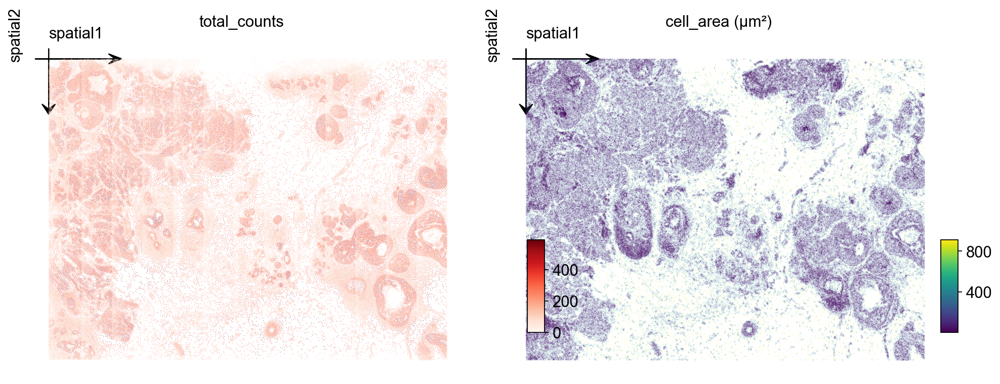

In [7]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
ov.pl.embedding(
    adata, basis='spatial', color='total_counts',
    vmax='p99', cmap='Reds', ax=axs[0], show=False, title='total_counts',
)
axs[0].invert_yaxis()
ov.pl.embedding(
    adata, basis='spatial', color='cell_area',
    vmax='p99', cmap='viridis', ax=axs[1], show=False, title='cell_area (µm²)',
)
axs[1].invert_yaxis()
plt.tight_layout()

## 5. Cell-level QC

Filter out cells with very low transcript counts — these are usually segmentation artifacts or empty nuclei. A threshold of 10 counts is mild; tune based on the `total_counts` histogram.

In [8]:
import scipy.sparse as sp
counts = np.asarray(adata.X.sum(axis=1)).ravel() if sp.issparse(adata.X) else adata.X.sum(axis=1)
print(f'cells pre-QC : {adata.n_obs}')
adata = adata[counts >= 10].copy()
print(f'cells post-QC: {adata.n_obs} (>= 10 transcripts/cell)')

cells pre-QC : 167780
cells post-QC: 164000 (>= 10 transcripts/cell)


## 6. Normalize, log-transform and scale

We use the standard `normalize_total` + `log1p` + `scale` pipeline. Because the panel is small (313 genes), we skip HVG selection and use all genes for PCA.

In [9]:
ov.pp.normalize_total(adata, target_sum=1e4)
ov.pp.log1p(adata)
ov.pp.scale(adata)


🔍 Count Normalization:
   Target sum: 10000.0
   Exclude highly expressed: False

✅ Count Normalization Completed Successfully!
   ✓ Processed: 164,000 cells × 313 genes
   ✓ Runtime: 0.04s



╭─ SUMMARY: scale ───────────────────────────────────────────────────╮
│  Duration: 0.7115s                                                 │
│  Shape:    164,000 x 313 (Unchanged)                               │
│                                                                    │
│  CHANGES DETECTED                                                  │
│  ────────────────                                                  │
│  ● UNS    │ ✚ REFERENCE_MANU                                       │
│           │ ✚ status                                               │
│           │ ✚ status_args                                          │
│                                                                    │
│  ● LAYERS │ ✚ scaled (array, 164000x313)                           │
│                                                                    │
╰────────────────────────────────────────────────────────────────────╯


## 7. PCA + neighbors + Leiden

Compute the first 50 principal components of the scaled matrix, build a k-NN graph, and run Leiden. For a 164k-cell Xenium section, `resolution=0.5` typically gives 10–20 clusters mapping to broad tissue structure. Push higher for finer subtypes, lower for compartments.

In [10]:
ov.pp.pca(adata, layer='scaled', n_pcs=50)
ov.pp.neighbors(
    adata, n_neighbors=15,
    use_rep='scaled|original|X_pca', n_pcs=50,
)
ov.pp.leiden(adata, resolution=0.5)
print(f"leiden: {adata.obs['leiden'].nunique()} clusters")

🚀 Using GPU to calculate PCA...
NVIDIA CUDA GPUs detected:
📊 [CUDA 0] NVIDIA H100 80GB HBM3
    ------------------------------ 5/81559 MiB (0.0%)
computing PCA🔍
    with n_comps=50

Using CUDA device: NVIDIA H100 80GB HBM3
✅ Using built-in torch_pca for GPU-accelerated PCA
   🚀 Using torch_pca PCA for CUDA GPU acceleration
   🚀 torch_pca PCA backend: CUDA GPU acceleration (supports sparse matrices)
   📊 PCA input data type: ndarray, shape: (164000, 313), dtype: float64
   🔧 solver_used_in_uns (planned): covariance_eigh


   🔧 PCA solver used: covariance_eigh
    finished✅ (0.56s)

╭─ SUMMARY: pca ─────────────────────────────────────────────────────╮
│  Duration: 0.5841s                                                 │
│  Shape:    164,000 x 313 (Unchanged)                               │
│                                                                    │
│  CHANGES DETECTED                                                  │
│  ────────────────                                                  │
│  ● UNS    │ ✚ pca                                                  │
│           │ └─ params: {'zero_center': True, 'use_highly_variable': Fa...│
│           │ ✚ scaled|original|cum_sum_eigenvalues                  │
│           │ ✚ scaled|original|pca_var_ratios                       │
│                                                                    │
│  ● OBSM   │ ✚ X_pca (array, 164000x50)                             │
│           │ ✚ scaled|original|X_pca (array, 164000x50)             │
│         

   🔍 Computing connectivity matrix...
   💡 Using UMAP-style connectivity


   ✓ Graph is fully connected

✅ KNN Graph Construction Completed Successfully!
   ✓ Processed: 164,000 cells with 15 neighbors each
   ✓ Results added to AnnData object:
     • 'neighbors': Neighbors metadata (adata.uns)
     • 'distances': Distance matrix (adata.obsp)
     • 'connectivities': Connectivity matrix (adata.obsp)

╭─ SUMMARY: neighbors ───────────────────────────────────────────────╮
│  Duration: 12.3926s                                                │
│  Shape:    164,000 x 313 (Unchanged)                               │
│                                                                    │
│  CHANGES DETECTED                                                  │
│  ────────────────                                                  │
│  ● UNS    │ ✚ neighbors                                            │
│           │ └─ params: {'n_neighbors': 15, 'method': 'torch', 'random_...│
│                                                                    │
│  ● OBSP   │ ✚ connectiv

Leiden:   0%|          | 0/10 [00:00<?, ?it/s]

L0 Batched(404):   0%|          | 0/100 [00:00<?, ?it/s]

L1 Batched(404):   0%|          | 0/100 [00:00<?, ?it/s]

L2 Batched(404):   0%|          | 0/100 [00:00<?, ?it/s]

L3 Batched(404):   0%|          | 0/100 [00:00<?, ?it/s]


╭─ SUMMARY: leiden ──────────────────────────────────────────────────╮
│  Duration: 158.7248s                                               │
│  Shape:    164,000 x 313 (Unchanged)                               │
│                                                                    │
│  CHANGES DETECTED                                                  │
│  ────────────────                                                  │
│  ● OBS    │ ✚ leiden (category)                                    │
│                                                                    │
│  ● UNS    │ ✚ leiden                                               │
│           │ └─ params: {'resolution': 0.5, 'random_state': 0, 'local_i...│
│                                                                    │
╰────────────────────────────────────────────────────────────────────╯
leiden: 20 clusters


## 8. Visualize Leiden clusters on the tissue

Plot the Leiden label and one marker gene over the spatial layout. Xenium centroids are in image-pixel convention (y grows downward); `ax.invert_yaxis()` lines the plot up with the tissue image you would overlay in step 10.

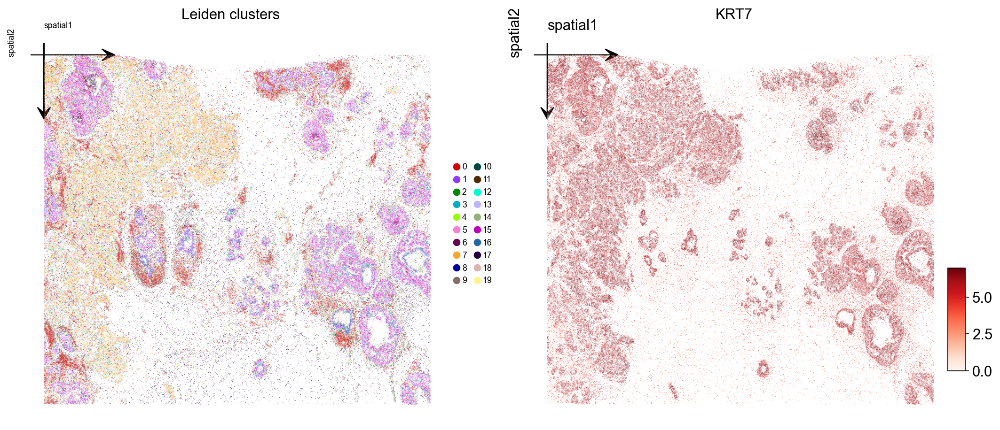

In [11]:
marker = next((g for g in ['KRT7', 'EPCAM', 'ERBB2', 'ESR1', 'KRT14']
               if g in adata.var_names), adata.var_names[0])

fig, axs = plt.subplots(1, 2, figsize=(13, 6))
ov.pl.embedding(
    adata, basis='spatial', color='leiden',
    palette=ov.pl.palette_112,
    legend_fontsize=8, ax=axs[0], show=False, title='Leiden clusters',
)
axs[0].invert_yaxis()
ov.pl.embedding(
    adata, basis='spatial', color=marker,
    vmax='p99.2', cmap='Reds', ax=axs[1], show=False, title=marker,
)
axs[1].invert_yaxis()
plt.tight_layout()

## 9. Visualize with cell polygons (`ov.pl.spatialseg`)

Unlike centroid scatter, `ov.pl.spatialseg` draws each cell as its actual segmented polygon. This is the right view for inspecting cluster boundaries against tissue morphology and for diagnosing oversegmentation.

On a 160k-cell section rendering every polygon produces a dense figure. To see the segmentation itself we also provide a cropped view (`crop_coord=(x0, x1, y0, y1)` in microns). Pick a region where tumor and stromal compartments should meet — for this breast sample, coordinates around (2000–3200 µm × 2500–3700 µm) land on a mixed compartment.

Rendering every cell polygon for the full 160k-cell section can take minutes and produce a dense image where individual cells aren't visible. We'll keep the full-section view to `ov.pl.embedding` (centroid scatter) and use `ov.pl.spatialseg` only on a cropped region, where the polygons are actually readable.

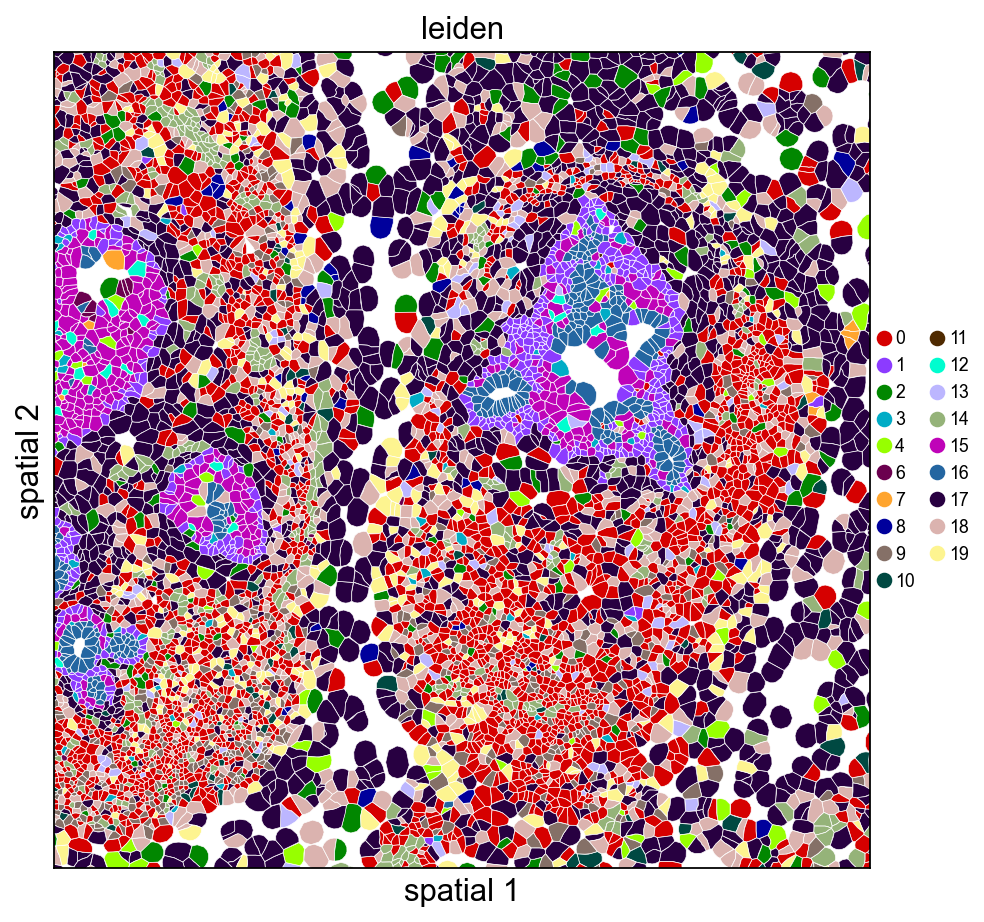

<Axes: title={'center': 'leiden'}, xlabel='spatial 1', ylabel='spatial 2'>

In [12]:
ov.pl.spatialseg(
    adata, color='leiden',
    library_id=library_id,
    edges_color='white', edges_width=0.3,
    alpha=1.0, legend_fontsize=8,
    palette=ov.pl.palette_112,
    crop_coord=(2000, 3200, 2500, 3700),
    figsize=(7, 6),
)

The same view coloured by a tumor-associated marker shows which polygons actually express it — useful for validating that a Leiden cluster and a gene signature agree.

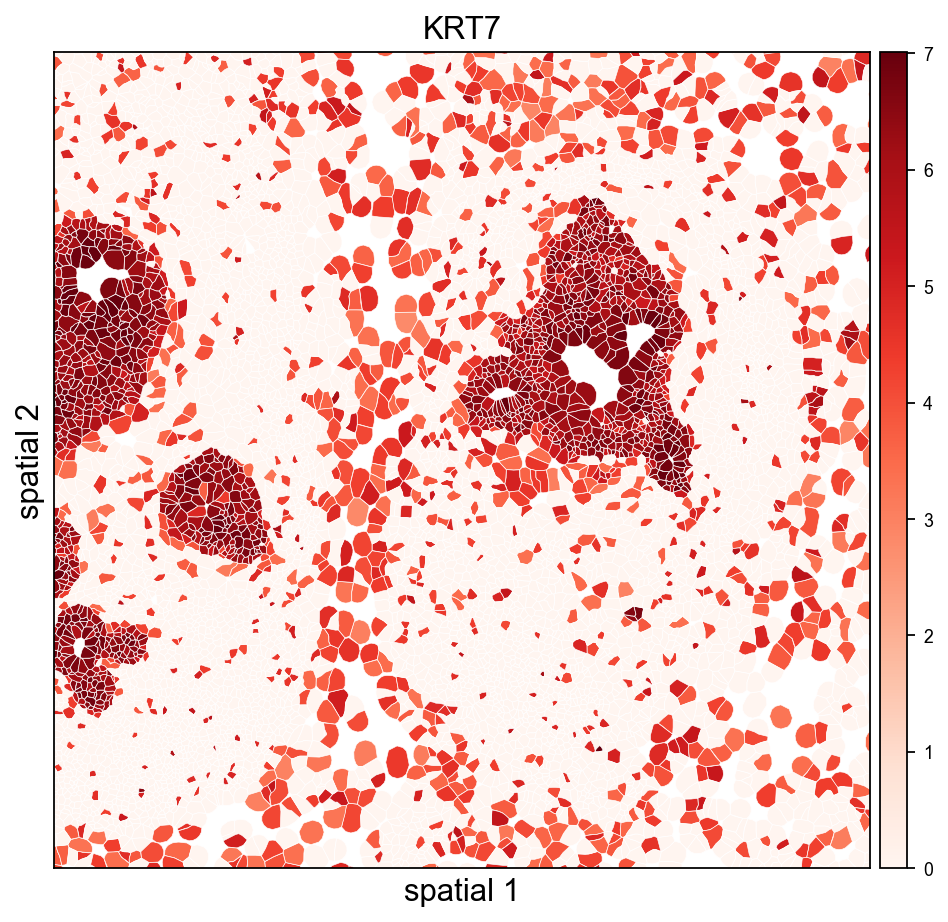

<Axes: title={'center': 'KRT7'}, xlabel='spatial 1', ylabel='spatial 2'>

In [13]:
import numpy as np
expr = adata[:, marker].X.toarray().ravel() if hasattr(adata[:, marker].X, 'toarray') else np.asarray(adata[:, marker].X).ravel()
vmax_marker = float(np.percentile(expr[expr > 0], 99)) if (expr > 0).any() else 1.0

ov.pl.spatialseg(
    adata, color=marker,
    library_id=library_id,
    edges_color='white', edges_width=0.3,
    alpha=1.0, legend_fontsize=8,
    cmap='Reds', vmax=vmax_marker,
    crop_coord=(2000, 3200, 2500, 3700),
    figsize=(7, 6),
)

## 10. (Optional) overlay on the morphology image

If you downloaded `morphology_focus.ome.tif` into `sample_dir`, re-read with `load_image=True` and use `ov.pl.spatial` / `ov.pl.spatialseg` to overlay labels on the morphology background. `read_xenium()` sets `tissue_hires_scalef = 1 / pixel_size` so spot coordinates land in image-pixel space.

```python
adata_img = ov.io.read_xenium(sample_dir, load_image=True)
adata_img.obs['leiden'] = adata.obs['leiden']   # carry over labels
ov.pl.spatialseg(
    adata_img, color='leiden', library_id=library_id,
    alpha_img=0.5, alpha=0.8,
    palette=ov.pl.palette_112,
    crop_coord=(2000, 3200, 2500, 3700),
)
```

For large Xenium sections (cm-scale), always prefer `crop_coord=(x0, x1, y0, y1)` in microns to zoom into a region — rendering every polygon for the full tissue can take minutes.

## 11. Save the processed object

Persist the analyzed AnnData so you can skip preprocessing next time. The WKT strings in `obs['geometry']` round-trip through `adata.write()` unchanged.

In [14]:
adata.write('data/xenium_breast_rep1_processed.h5ad')

In [6]:
#adata=ov.read('data/xenium_breast_rep1_processed.h5ad')

## 12. Cache the loaded AnnData for fast re-reads

Parsing `cell_feature_matrix.h5` + `cells.csv.gz` + `cell_boundaries.parquet` (including the per-cell WKT polygon construction) takes a few seconds the first time. Pass `cache_file=` to `read_xenium()` to write an h5ad snapshot alongside the outs folder — subsequent calls with the same `cache_file` skip all the parsing and just read the h5ad back, typically ~30× faster.

The cache includes everything: counts, obs/var, spatial coords, polygon WKT strings, image payloads, and experiment metadata. Delete the cache file to force a re-read after updating any of the source files.

In [15]:
import time, os

cache_path = 'data/xenium_breast_rep1_cache.h5ad'
if os.path.exists(cache_path):
    os.remove(cache_path)  # start fresh to show the timing difference

t0 = time.time()
_ = ov.io.read_xenium(sample_dir, load_image=False, cache_file=cache_path)
t_cold = time.time() - t0

t0 = time.time()
_ = ov.io.read_xenium(sample_dir, cache_file=cache_path)
t_warm = time.time() - t0

print(f'cold (raw parse + cache write): {t_cold:.2f} s')
print(f'warm (cache read)              : {t_warm:.2f} s')
print(f'speedup                        : {t_cold / t_warm:.1f}x')

[Xenium] Reading Xenium data from: /scratch/users/steorra/xenium_test/breast_rep1


[Xenium] Loaded cell polygons (geometry WKT) for 167780/167780 cells


[Xenium] Wrote cache AnnData to: /scratch/users/steorra/analysis/omicverse_dev/omicverse/omicverse_guide/docs/Tutorials-space/data/xenium_breast_rep1_cache.h5ad
[Xenium] Done (n_obs=167780, n_vars=313, library_id=Replicate 1)
[Xenium] Reading cached AnnData from: /scratch/users/steorra/analysis/omicverse_dev/omicverse/omicverse_guide/docs/Tutorials-space/data/xenium_breast_rep1_cache.h5ad


cold (raw parse + cache write): 9.70 s
warm (cache read)              : 0.27 s
speedup                        : 35.9x


## 13. Overlay Leiden clusters on the morphology image

When `morphology_focus.ome.tif` sits next to the `cell_feature_matrix.h5`, pass `load_image=True` and `ov.pl.spatialseg` will render cell polygons on top of the morphology background. The OME-TIFF is a **multi-resolution pyramid** (8 levels from 25K×35K down to 201×276), so we only read one level: `image_max_dim=4096` picks the highest pyramid level whose largest dimension fits under 4096 px (~1611×2213 for this sample, ~7 MB as uint16, <1 s to load). That is the Xenium analogue of Visium's `hires.png` — no need to touch the 25K×35K full-resolution data.

The loader rescales `tissue_hires_scalef` to the chosen pyramid level, so micron coordinates land on the downsampled image without any extra math on your side.

In [9]:
# One-time call: loads the image, composes the full AnnData, writes the cache
adata_img = ov.io.read_xenium(
    sample_dir,
    load_image=True,
    image_max_dim=4096,
    cache_file='data/xenium_breast_rep1_with_image_cache.h5ad',
)
# Carry Leiden labels from the already-processed adata so we can visualise
# clusters without re-running the pipeline on the image-backed copy.
adata_img = adata_img[adata.obs_names].copy()
adata_img.obs['leiden'] = adata.obs['leiden'].values
img = adata_img.uns['spatial'][library_id]['images']['hires']
sf  = adata_img.uns['spatial'][library_id]['scalefactors']
print('image shape     :', img.shape, 'dtype:', img.dtype)
print('hires_scalef    :', round(sf['tissue_hires_scalef'], 4),
      '(micron -> image-pixel)')
print('fullres diameter:', round(sf['spot_diameter_fullres'], 2), 'px')

[Xenium] Reading cached AnnData from: /scratch/users/steorra/analysis/omicverse_dev/omicverse/omicverse_guide/docs/Tutorials-space/data/xenium_breast_rep1_with_image_cache.h5ad
image shape     : (1611, 2213) dtype: uint16
hires_scalef    : 0.2941 (micron -> image-pixel)
fullres diameter: 4.62 px


image shape     : (1611, 2213) dtype: uint16
hires_scalef    : 0.2941 (micron -> image-pixel)
fullres diameter: 4.62 px


Cropped H&E / DAPI overlay — Leiden on the left, KRT7 on the right. `crop_coord` is in microns (same convention as the other spatialseg calls above); the loader's rescaled `tissue_hires_scalef` handles the mapping into image-pixel space for the imshow call.

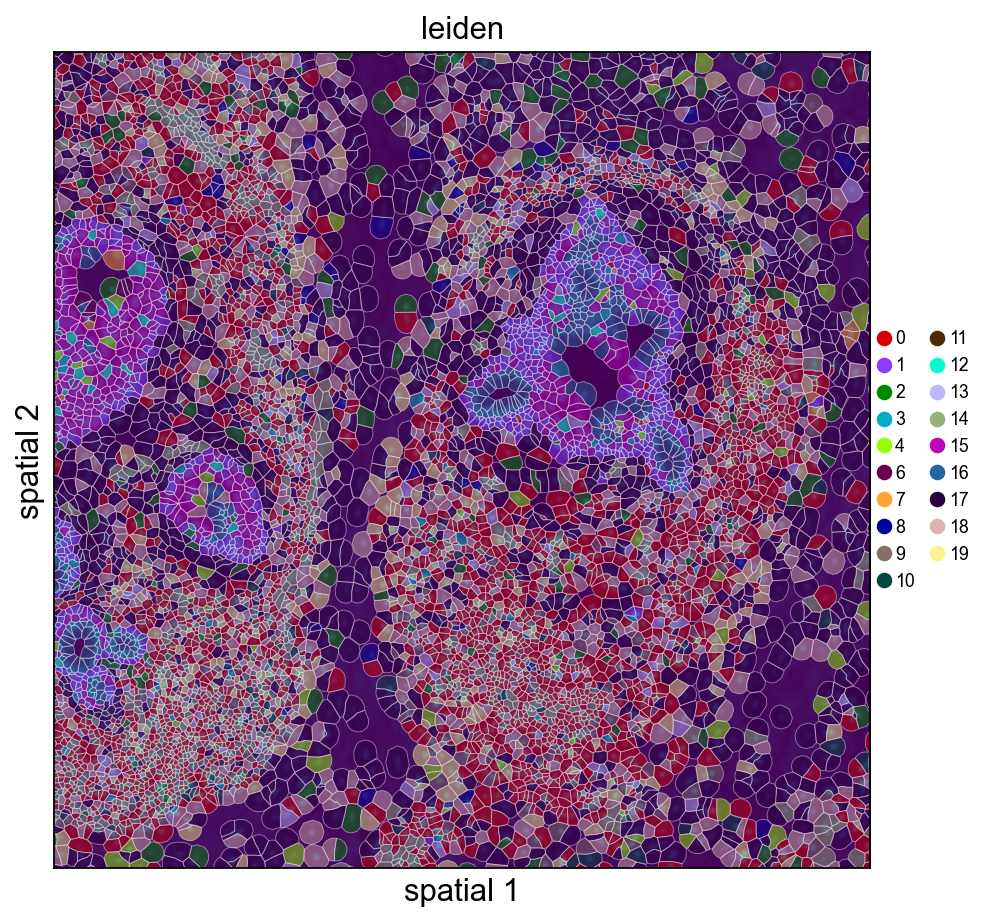

<Axes: title={'center': 'leiden'}, xlabel='spatial 1', ylabel='spatial 2'>

In [11]:
ov.pl.spatialseg(
    adata_img, color='leiden',
    library_id=library_id,
    edges_color='white', edges_width=0.4,
    # alpha=0.45 keeps the DAPI morphology visible through the cluster fills so the
    # polygon-to-nucleus alignment stays obvious. Raise closer to 1.0 if you only
    # care about cluster assignment and not the background.
    alpha=0.45, alpha_img=1.0,
    legend_fontsize=8,
    palette=ov.pl.palette_112,
    crop_coord=(2000, 3200, 2500, 3700),
    figsize=(7, 6),
)

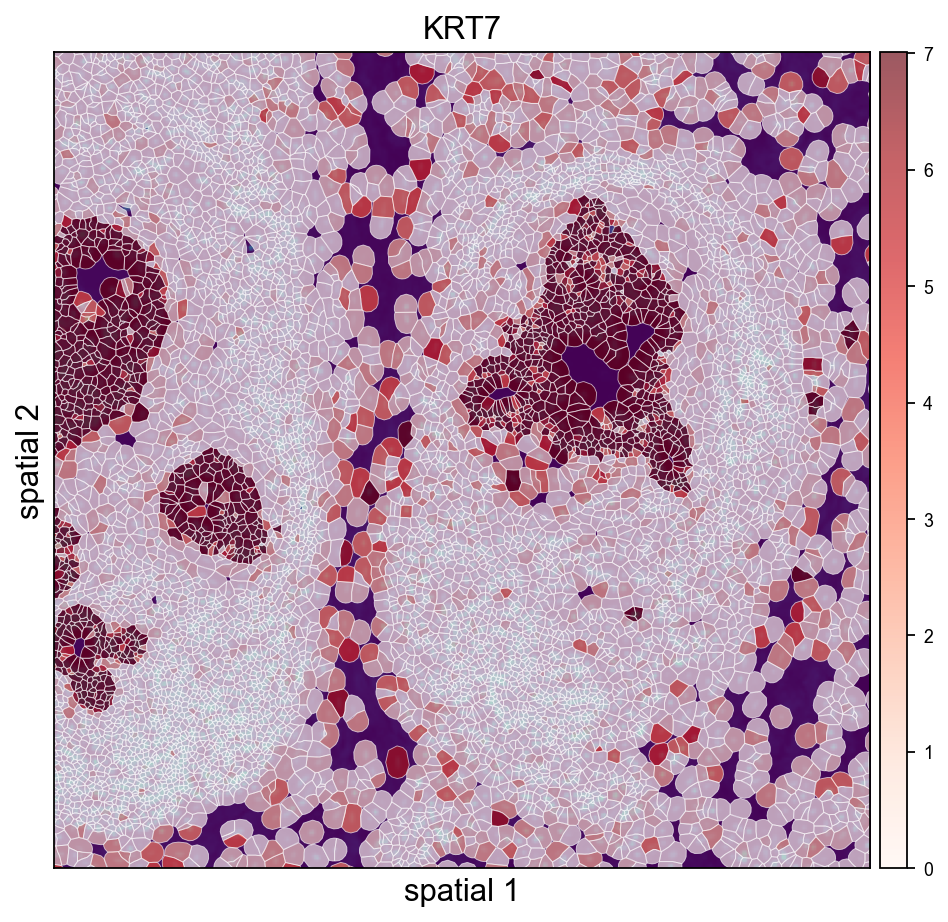

<Axes: title={'center': 'KRT7'}, xlabel='spatial 1', ylabel='spatial 2'>

In [18]:
ov.pl.spatialseg(
    adata_img, color=marker,
    library_id=library_id,
    edges_color='white', edges_width=0.4,
    alpha=0.65, alpha_img=1.0,
    legend_fontsize=8,
    cmap='Reds', vmax=vmax_marker,
    crop_coord=(2000, 3200, 2500, 3700),
    figsize=(7, 6),
)

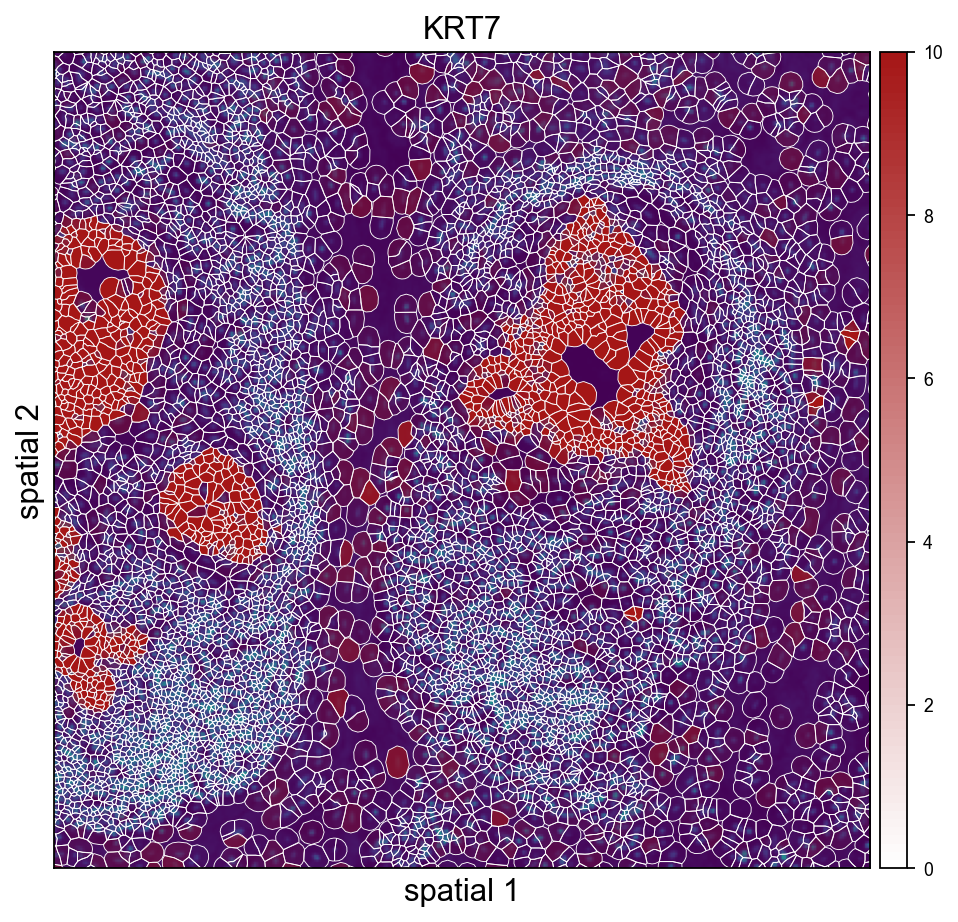

<Axes: title={'center': 'KRT7'}, xlabel='spatial 1', ylabel='spatial 2'>

In [16]:
ov.pl.spatialseg(
    adata_img, color='KRT7',
    library_id=library_id,
    edges_color='white', edges_width=0.4,
    alpha=0.65, alpha_img=1.0,
    legend_fontsize=8,
    cmap=ov.pl.create_custom_colormap('#a51616'), vmax=10,
    crop_coord=(2000, 3200, 2500, 3700),
    figsize=(7, 6),
)

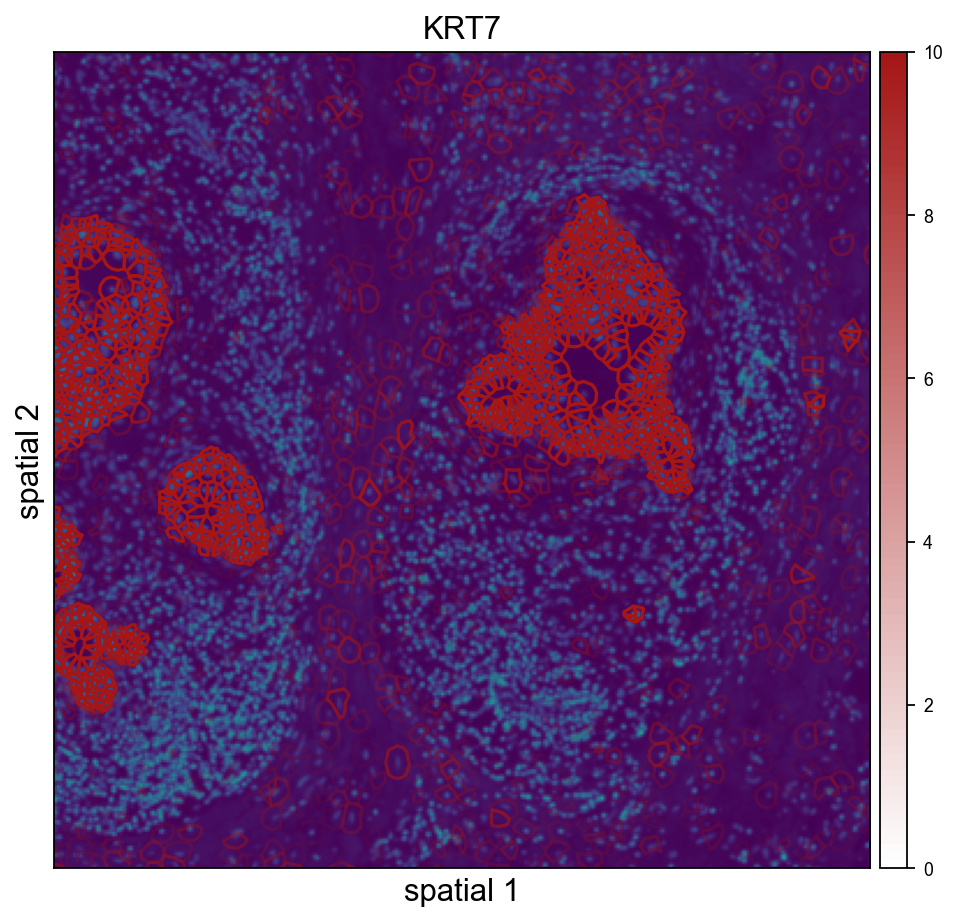

<Axes: title={'center': 'KRT7'}, xlabel='spatial 1', ylabel='spatial 2'>

In [18]:
ov.pl.spatialseg(
    adata_img, color='KRT7',
    library_id=library_id,
    edges_color='white', edges_width=0.4,
    alpha=0.65, alpha_img=1.0,
    legend_fontsize=8,
    cmap=ov.pl.create_custom_colormap('#a51616'), vmax=10,
    seg_contourpx=1.5,
    crop_coord=(2000, 3200, 2500, 3700),
    figsize=(7, 6),
)

### Quick alignment check — polygon outlines on DAPI

To confirm the morphology image and the cell polygons are correctly registered, render a tight crop with *outlines only* (no fill) over the DAPI background. Every polygon should contain exactly one DAPI-bright nucleus.

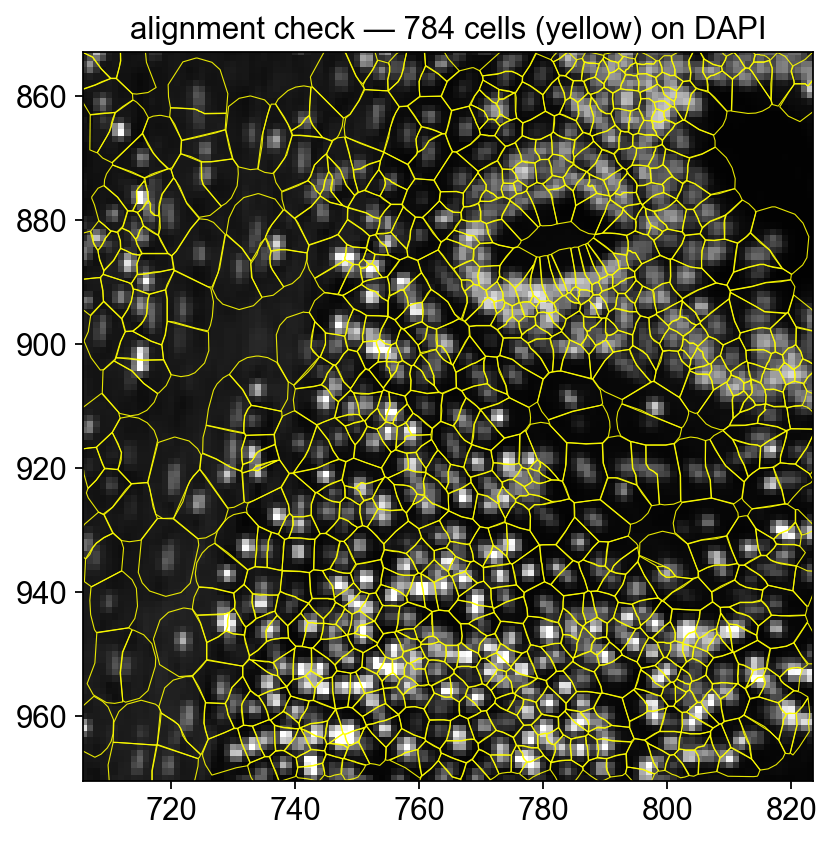

In [19]:
# Render polygons directly — gives full control of facecolor='none' so the fills
# don't mask the DAPI (`ov.pl.spatialseg(alpha=0, ...)` ends up skipping the
# collection entirely when alpha is zero).
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon as _MplPoly
from matplotlib.collections import PatchCollection
from shapely import wkt as _wkt

x0u, x1u, y0u, y1u = 2400, 2800, 2900, 3300  # tighter crop (microns)
sf = adata_img.uns['spatial'][library_id]['scalefactors']['tissue_hires_scalef']
xy = adata_img.obsm['spatial']
mask = (xy[:,0] > x0u) & (xy[:,0] < x1u) & (xy[:,1] > y0u) & (xy[:,1] < y1u)

fig, ax = plt.subplots(figsize=(7, 6))
img = adata_img.uns['spatial'][library_id]['images']['hires']
ax.imshow(img, origin='upper', cmap='gray',
          vmax=float(np.percentile(img, 99.5)))
patches = []
for i in np.where(mask)[0]:
    w = adata_img.obs['geometry'].iloc[i]
    if not w: continue
    geom = _wkt.loads(w)
    if not hasattr(geom, 'exterior'): continue
    xs, ys = geom.exterior.xy
    pts = np.column_stack((np.array(xs)*sf, np.array(ys)*sf))
    patches.append(_MplPoly(pts, closed=True))
ax.add_collection(PatchCollection(
    patches, facecolor='none', edgecolor='yellow', linewidth=0.5, alpha=0.9,
))
ax.set_xlim(x0u * sf, x1u * sf)
ax.set_ylim(y1u * sf, y0u * sf)   # inverted y (image convention)
ax.set_title(f'alignment check — {len(patches)} cells (yellow) on DAPI')
ax.set_aspect('equal')
plt.show()